In [10]:
import pandas as pd
import glob
import tensorflow as tf

In [11]:
device_name = tf.test.gpu_device_name()
if "GPU" not in device_name:
    print("GPU device not found")
print('Found GPU at: {}'.format(device_name))

GPU device not found
Found GPU at: 


In [12]:

# Define as constantes de tamanho de lote, número de épocas, largura da imagem e altura da imagem 

BATCH_SIZE = 16
EPOCHS = 30
IMG_WIDTH = 300
IMG_HEIGHT = 400

# Otimiza o desempenho ao carregar os dados utilizando tensorflow

AUTOTUNE = tf.data.experimental.AUTOTUNE
tf.random.set_seed(10)

In [13]:
import os

notebook_path = os.getcwd()
print(notebook_path)

/Users/isabela/Desktop/jupyterLab/PRJ


In [14]:
# Recupera de forma recursiva todos os arquivos contidos na pasta 'Curated_X-Ray_Dataset', que contém as imagens de raio-X para treinamento do modelo

filenames = glob.glob(notebook_path + '/Curated_X-Ray_Dataset/*/*',  
                   recursive = True) 

# Confirma a quantidade de arquivos que foi englobado pelo comando anterior e imprime o caminho dos três primeiros para visualização

print(len(filenames))
filenames[:3]

9208


['/Users/isabela/Desktop/jupyterLab/PRJ/Curated_X-Ray_Dataset/Pneumonia-Bacterial/Pneumonia-Bacterial (296).jpg',
 '/Users/isabela/Desktop/jupyterLab/PRJ/Curated_X-Ray_Dataset/Pneumonia-Bacterial/Pneumonia-Bacterial (2740).jpg',
 '/Users/isabela/Desktop/jupyterLab/PRJ/Curated_X-Ray_Dataset/Pneumonia-Bacterial/Pneumonia-Bacterial (2310).jpg']

In [15]:
# Cria um novo dataset vazio chamado 'data'
# Para cada caminho de arquivo, corta o caminho ao encontrar uma '/' na posição -2 da string
# Define a variável 'path' como o caminho completo do arquivo

data = pd.DataFrame()
for item in range(0, len(filenames)):
    target = filenames[item].split('/')[-2]
    path = filenames[item]

    # Cria as colunas 'filename' e 'class' dentro do dataset 'data', as quais receberão o conteúdo definido anteriormente pelas variáveis criadas 'target' e 'path'
    # A variável 'class' contém o nome da doença respiratória encontrada na imagem ou exibe 'Normal' quando o indivíduo é saudável
    data.loc[item, 'filename'] = path
    data.loc[item, 'class'] = target

# Imprime a quantidade de imagens de cada categoria encontrada, incluindo os valores nulos, caso existam
# Imprime as primeiras e últimas linhas do dataset
print(data['class'].value_counts(dropna=False))
data

class
Normal                 3270
Pneumonia-Bacterial    3001
Pneumonia-Viral        1656
COVID-19               1281
Name: count, dtype: int64


,filename,class
0,/Users/isabela/Desktop/jupyterLab/PRJ/Curated_...,Pneumonia-Bacterial
1,/Users/isabela/Desktop/jupyterLab/PRJ/Curated_...,Pneumonia-Bacterial
2,/Users/isabela/Desktop/jupyterLab/PRJ/Curated_...,Pneumonia-Bacterial
3,/Users/isabela/Desktop/jupyterLab/PRJ/Curated_...,Pneumonia-Bacterial
4,/Users/isabela/Desktop/jupyterLab/PRJ/Curated_...,Pneumonia-Bacterial
...,...,...
9203,/Users/isabela/Desktop/jupyterLab/PRJ/Curated_...,Normal
9204,/Users/isabela/Desktop/jupyterLab/PRJ/Curated_...,Normal
9205,/Users/isabela/Desktop/jupyterLab/PRJ/Curated_...,Normal
9206,/Users/isabela/Desktop/jupyterLab/PRJ/Curated_...,Normal


In [16]:
# Embaralha as linhas do dataset de forma reproduzível, ou seja, definindo uma semente para geração de aleatoriedade, permitindo que o mesmo embaralhamento seja realizado novamente
# Modifica o dataset original para que ele descarte os índices associados às linhas antes do embaralhamento e os reorganiza de forma sequencial
# Imprime as primeiras e últimas linhas do dataset

from sklearn.utils import shuffle

data = shuffle(data, random_state=42)
data.reset_index(drop=True, inplace=True)
data

,filename,class
0,/Users/isabela/Desktop/jupyterLab/PRJ/Curated_...,Pneumonia-Bacterial
1,/Users/isabela/Desktop/jupyterLab/PRJ/Curated_...,Pneumonia-Bacterial
2,/Users/isabela/Desktop/jupyterLab/PRJ/Curated_...,Normal
3,/Users/isabela/Desktop/jupyterLab/PRJ/Curated_...,COVID-19
4,/Users/isabela/Desktop/jupyterLab/PRJ/Curated_...,Pneumonia-Bacterial
...,...,...
9203,/Users/isabela/Desktop/jupyterLab/PRJ/Curated_...,COVID-19
9204,/Users/isabela/Desktop/jupyterLab/PRJ/Curated_...,COVID-19
9205,/Users/isabela/Desktop/jupyterLab/PRJ/Curated_...,COVID-19
9206,/Users/isabela/Desktop/jupyterLab/PRJ/Curated_...,Pneumonia-Bacterial


In [17]:
# Define um dicionário que associa um número inteiro à classe/categoria da doença respiratória
# Usa o método map para mapear os valores de acordo com o dicionário e substitui os valores originais pelos números correspondentes 
# Imprime as primeiras e últimas linhas do dataset

numbers = {
'Normal' : '0',
'Pneumonia-Bacterial': '1',
'Pneumonia-Viral' : '2',
'COVID-19' : '3',
}

data['class'] = data['class'].map(numbers)
data

,filename,class
0,/Users/isabela/Desktop/jupyterLab/PRJ/Curated_...,1
1,/Users/isabela/Desktop/jupyterLab/PRJ/Curated_...,1
2,/Users/isabela/Desktop/jupyterLab/PRJ/Curated_...,0
3,/Users/isabela/Desktop/jupyterLab/PRJ/Curated_...,3
4,/Users/isabela/Desktop/jupyterLab/PRJ/Curated_...,1
...,...,...
9203,/Users/isabela/Desktop/jupyterLab/PRJ/Curated_...,3
9204,/Users/isabela/Desktop/jupyterLab/PRJ/Curated_...,3
9205,/Users/isabela/Desktop/jupyterLab/PRJ/Curated_...,3
9206,/Users/isabela/Desktop/jupyterLab/PRJ/Curated_...,1


In [18]:
# Define uma função para verificar se as extensões de todos os arquivos contidos na coluna 'filename' do dataset são '.jpg'; caso encontre algum arquivo com extensão diferente, armazena o seu índice em uma lista denominada 'indexes' e imprime o seu índice seguido do seu caminho

indexes=[]

def find_no_jpg(x):
    if x[-4:] != '.jpg':
        idx = data[data['filename'] == x].index
        print(idx)
        indexes.append(idx[0])
        print(idx[0], x)
    return x

# Mapeia a coluna 'filename' do dataset utilizando a função criada.

data['filename'].map(find_no_jpg)

# Imprime o shape do dataset antes e depois de excluir os arquivos com extensões diferentes
# Descarta as linhas do dataset que contenham arquivos com extensões diferentes de '.jpg', modificando os índices do dataset original e os ordenando de forma sequencial

print(data.shape)
data.drop(index=indexes, axis=0, inplace=True)
data.reset_index(drop=True, inplace=True)
print(data.shape)

(9208, 2)
(9208, 2)


In [19]:
# Imprime as dimensões (altura, largura e canais de cor) das 20 primeiras imagens para ter noção da variabilidade do dataset
# A altura indica a quantidade de pixels na direção vertical; a largura indca a quantidade de pixels na direção horizontal e os canais de cor indicam '3' para imagens coloridas (verde, vermelho e azul) ou '1' para imagens com tons de cinza

import cv2

for item in range(0, 20):
    path = data.loc[item, 'filename']
    img  = cv2.imread(path)
    print(img.shape)

(736, 1216, 3)
(300, 400, 3)
(1662, 1732, 3)
(242, 244, 3)
(640, 1040, 3)
(225, 225, 3)
(712, 1088, 3)
(1317, 1857, 3)
(663, 640, 3)
(1499, 1840, 3)
(959, 1268, 3)
(1024, 1024, 3)
(784, 1224, 3)
(1024, 1024, 3)
(300, 400, 3)
(1024, 1024, 3)
(1261, 1360, 3)
(574, 863, 3)
(300, 400, 3)
(1296, 1728, 3)


In [20]:
from sklearn.model_selection import train_test_split

# Separa conjuntos de treinamento e validação, com proporção 90/10 utilizando uma semente para garantir que a separação seja reproduzível, além de estratificar os dados com base na categoria da imagem (coluna 'class'), ou seja, mantém a mesma proporção de distribuiçao entre as classes
# Imprime as quantidades de amostras em cada categoria para os dados de treinamento e posteriormente para os dados de validação

train_data, val_data = train_test_split(data, test_size=0.1, random_state=42, stratify=data['class'])
print(train_data['class'].value_counts(dropna=False))
print(val_data['class'].value_counts(dropna=False))

class
0    2943
1    2701
2    1490
3    1153
Name: count, dtype: int64
class
0    327
1    300
2    166
3    128
Name: count, dtype: int64


In [21]:
# Repete o mesmo procedimento anterior, separando 10% do conjunto de treinamento para o conjunto de teste

train_data, test_data = train_test_split(train_data, test_size=0.1, random_state=42, stratify=train_data['class'])
print(train_data['class'].value_counts(dropna=False))
print(test_data['class'].value_counts(dropna=False))

class
0    2648
1    2431
2    1341
3    1038
Name: count, dtype: int64
class
0    295
1    270
2    149
3    115
Name: count, dtype: int64


In [22]:

from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Realiza o pré-processamento das imagens, além de fazer o processo de data augmentation para aumentar a variabilidade dos dados de treinamento e melhorar o desempenho do modelo
# Redimensiona o valores dos pixels das imagens de treinamento para um intervalo entre 0 e 1, aplica zoom, brilho, deslocamentos de altura e largura, e rotações, todos de forma aleatória 

datagen = ImageDataGenerator(rescale = 1./255,
                             zoom_range=0.1, # 0.05
                             brightness_range=[0.9, 1.0],
                             height_shift_range=0.05, 
                             width_shift_range=0.05,
                             rotation_range=10, 
                            )

# Somente redimensiona o valores dos pixels das imagens de teste para um intervalo entre 0 e 1

test_datagen = ImageDataGenerator(rescale = 1./255)

# Geram imagens a partir de dataframes (contendo os caminhos das imagens e as respectivas classes) usando os generators definidos anteriormente
# Flow_from_dataframe especifica alguns parâmetros para serem aplicados nos dataframes e gerarem lotes de dados; especifica o nome da coluna que possui o caminho do arquivo, o nome da coluna que possui a categoria, o tamanho das imagens após redimensionamento, modo de cor (em escala de cinza), tamanho do lote dos dados gerados, modo das classes, embaralhamento e otimização no carregamennto dos dados


train_gen = datagen.flow_from_dataframe(train_data,
                                        x_col="filename",
                                        y_col="class",
                                        target_size=(IMG_WIDTH, IMG_HEIGHT),
                                        color_mode='grayscale',
                                        batch_size=BATCH_SIZE,
                                        class_mode='categorical',
                                        shuffle=True,
                                        num_parallel_calls=AUTOTUNE)

val_gen = test_datagen.flow_from_dataframe(val_data,
                                        x_col="filename",
                                        y_col="class",
                                        target_size=(IMG_WIDTH, IMG_HEIGHT),
                                        color_mode='grayscale',
                                        batch_size=BATCH_SIZE,
                                        class_mode='categorical',
                                        shuffle=False,
                                        num_parallel_calls=AUTOTUNE)

test_gen = test_datagen.flow_from_dataframe(test_data,
                                        x_col="filename",
                                        y_col="class",
                                        target_size=(IMG_WIDTH, IMG_HEIGHT),
                                        color_mode='grayscale',
                                        batch_size=BATCH_SIZE,
                                        class_mode='categorical',
                                        shuffle=False,
                                        num_parallel_calls=AUTOTUNE)

Found 7458 validated image filenames belonging to 4 classes.
Found 921 validated image filenames belonging to 4 classes.
Found 829 validated image filenames belonging to 4 classes.


In [23]:
from tensorflow.keras import layers
from tensorflow.keras import Model, Sequential

# Define uma função que cria o modelo, especificando seus blocos de convolução, composto por uma camada de input, blocos de convolução (Conv2D - detecta padrões, Maxpool2D - reduz dimensionalidade e Dropout - desativa neurônios de forma aleatória), global average pooling para calcular a média das características, uma de finalização e uma de output
# Por fim o modelo é compilado e retornado

def create_model():
    with tf.device('/gpu:0'):

        model = Sequential([
            layers.Input(shape=(IMG_WIDTH, IMG_HEIGHT, 1), name='input'),
            
            layers.Conv2D(filters=128, kernel_size=3, activation='relu', padding='same', name='conv2d_1'),
            layers.MaxPool2D(pool_size=2, name='maxpool2d_1'),
            layers.Dropout(0.1, name='dropout_1'),
            
            layers.Conv2D(filters=128, kernel_size=3, activation='relu', padding='same', name='conv2d_2'),
            layers.MaxPool2D(pool_size=2, name='maxpool2d_2'),
            layers.Dropout(0.1, name='dropout_2'),
            
            layers.Conv2D(filters=128, kernel_size=3, activation='relu', padding='same', name='conv2d_3'),
            layers.MaxPool2D(pool_size=2, name='maxpool2d_3'),
            layers.Dropout(0.1, name='dropout_3'),
            
            layers.Conv2D(filters=256, kernel_size=3, activation='relu', padding='same', name='conv2d_4'),
            layers.MaxPool2D(pool_size=2, name='maxpool2d_4'),
            layers.Dropout(0.1, name='dropout_4'),
            
            layers.Conv2D(filters=256, kernel_size=3, activation='relu', padding='same', name='conv2d_5'),
            layers.MaxPool2D(pool_size=2, name='maxpool2d_5'),
            layers.Dropout(0.1, name='dropout_5'),
            
            layers.Conv2D(filters=512, kernel_size=3, activation='relu', padding='same', name='conv2d_6'),
            layers.MaxPool2D(pool_size=2, name='maxpool2d_6'),
            layers.Dropout(0.1, name='dropout_6'),
            
            layers.Conv2D(filters=512, kernel_size=3, activation='relu', padding='same', name='conv2d_7'),
            layers.MaxPool2D(pool_size=2, name='maxpool2d_7'),
            layers.Dropout(0.1, name='dropout_7'),
            
            layers.GlobalAveragePooling2D(name='global_average_pooling2d'),
            layers.Flatten(),
            
            layers.Dense(1024, activation='relu'),
            layers.Dropout(0.1, name='dropout_head_2'),
            layers.Dense(128, activation='relu'),
            
            layers.Dense(units=4, activation='softmax', name='output')
        ])

        model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

    return model

model = create_model()

In [24]:
# Exibe a arquitetura do modelo, formato de saída da camada, quantidade de parâmetros e disposição de camadas
# shape possui 4 valores = batch size, tamanho altura, tamanho largura e número de filtros/features extraídas das imagens

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 300, 400, 128)     1280      
                                                                 
 maxpool2d_1 (MaxPooling2D)  (None, 150, 200, 128)     0         
                                                                 
 dropout_1 (Dropout)         (None, 150, 200, 128)     0         
                                                                 
 conv2d_2 (Conv2D)           (None, 150, 200, 128)     147584    
                                                                 
 maxpool2d_2 (MaxPooling2D)  (None, 75, 100, 128)      0         
                                                                 
 dropout_2 (Dropout)         (None, 75, 100, 128)      0         
                                                                 
 conv2d_3 (Conv2D)           (None, 75, 100, 128)      1

In [25]:
import datetime
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping

# Guarda o tempo atual antes de realizar o treinamento do modelo

init_time = datetime.datetime.now()

# Calcula o número de passos (etapas) por época com base no batch size para os conjuntos de treinamento e validação

train_steps = train_gen.samples 
val_steps = val_gen.samples 

# Configura callbacks para terminar o modelo quando não houver melhora na função de perda por 8 épocas seguidas 
# Salva modelos (checkpoints) com as menores funções de perda durante o treinamento com o nome especificado
# Diminui a taxa de aprendizado se não houver melhoria função de perda por 8 épocas consecutivas, estipula um valor mínimo para a taxa de aprendizado e um fator de redução

early_stopping = EarlyStopping(monitor="val_loss", patience=8, mode="min")
checkpoint = ModelCheckpoint("loss-{val_loss:.4f}.h5", monitor="val_loss", verbose=0, 
                             save_best_only=True, save_weights_only=True, mode="min")
learning_rate_reduction = ReduceLROnPlateau(monitor="val_loss", factor=0.1, patience=4, 
                                            min_lr=1e-7, verbose=1, mode="min")

# Treina o modelo com as informações especificadas anteriormente 

history = model.fit(
    train_gen,
    validation_data=val_gen,
    batch_size=BATCH_SIZE,
    epochs=EPOCHS,
    steps_per_epoch=train_steps,
    validation_steps=val_steps,
    callbacks=[
        checkpoint, 
                early_stopping, 
                learning_rate_reduction],
    verbose=1,
    )

# Calcula o tempo total necessário para treinar o modelo até o fim e imprime na tela

required_time = datetime.datetime.now() - init_time
print(f'\nRequired time:  {str(required_time)}\n')

Epoch 1/30
   1/7458 [..............................] - ETA: 42:34:24 - loss: 1.3873 - accuracy: 0.1250


KeyboardInterrupt



In [ ]:
# Salva o modelo treinado no caminho especificado

model.save(notebook_path + '/savedModel')

In [26]:
!pip install tensorflow-addons
import tensorflow_addons as tfa

DEPRECATION: Loading egg at /usr/local/lib/python3.11/site-packages/AHRS-0.3.1-py3.11.egg is deprecated. pip 23.3 will enforce this behaviour change. A possible replacement is to use pip for package installation..
DEPRECATION: Loading egg at /usr/local/lib/python3.11/site-packages/imufusion-1.2.1-py3.11-macosx-12-x86_64.egg is deprecated. pip 23.3 will enforce this behaviour change. A possible replacement is to use pip for package installation..

[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python3.11 -m pip install --upgrade pip


/usr/local/lib/python3.11/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [28]:
# Cria um dataframe com métricas do modelo treinado e plota um gráfico para mostrar a evolução das métricas ao longo das épocas
# Imprime o valor mínimo da função de perda

history_df = pd.DataFrame(history.history)
history_df.loc[0:, ['loss', 'val_loss']].plot()
print("Minimum Validation Loss: {:0.4f}".format(history_df['val_loss'].min()));

NameError: name 'history' is not defined

In [60]:
# import pandas as pd
# import glob
# import cv2
# import os
# import numpy as np
# import datetime
# import tensorflow as tf
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
# from tensorflow.keras import layers
# from tensorflow.keras import Model, Sequential
# from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping
# import tensorflow_addons as tfa
# from sklearn.utils import shuffle
# from sklearn.model_selection import train_test_split

# # Carrega o modelo salvo

# model = tf.keras.models.load_model(notebook_path + '/savedModel')

In [63]:
# Calcula o número de passos (etapas) por época com base no batch size para o conjunto de teste

test_steps = test_gen.samples // BATCH_SIZE

# Calcula a perda e a acurácia no conjunto de dados de teste e imprime na tela

test_loss, test_acc = model.evaluate(test_gen, steps=test_steps)
print('\naccuracy:', test_acc, 'loss: ',test_loss)

51/51 [==============================] - 161s 3s/step - loss: 0.2635 - f1_macro: 0.8716

accuracy: 0.8716422319412231 loss:  0.26353538036346436


In [64]:
# Prevê as classes para os dados de teste
# Retorna o índice da classe com a maior probabilidade para cada amostra
# Exibe as primeiras 20 classes preditas
import numpy as np

predict = model.predict(test_gen, steps=test_steps)
y_hat = np.argmax(predict, axis=1)
y_hat[:20]

51/51 [==============================] - 167s 3s/step


array([3, 2, 1, 0, 3, 1, 0, 2, 2, 0, 3, 2, 3, 0, 1, 0, 3, 0, 0, 3])

In [65]:
# Cria um dataset e copia a coluna 'class' dos dados de teste

test_labels_df = pd.DataFrame()
test_labels_df[['class']] = test_data[['class']]

# Transforma as classes numéricas em números inteiros 

numbers = {
'0' : 0,
'1' : 1,
'2' : 2,
'3' : 3,
}

# Mapeia as classes numéricas dos dados de teste e as substitui pelos números inteiros equivalentes
# Limita o dataframe test_labels_df para conter somente as primeiras linhas até o valor calculado por test_steps*BATCH_SIZE

test_labels_df['class'] = test_labels_df['class'].map(numbers)
test_labels_df = test_labels_df[ : test_steps*BATCH_SIZE]

# Converte a coluna 'class' para um array numpy e retorna os 20 primeiros elementos

y_test = np.array(test_labels_df['class'])
y_test[:20]

array([3, 1, 1, 0, 3, 1, 0, 1, 2, 0, 3, 2, 3, 0, 1, 0, 3, 0, 0, 3])

              precision    recall  f1-score   support

           0       0.96      0.99      0.97       292
           1       0.84      0.86      0.85       266
           2       0.71      0.63      0.67       145
           3       1.00      0.99      1.00       113

    accuracy                           0.88       816
   macro avg       0.88      0.87      0.87       816
weighted avg       0.88      0.88      0.88       816
 



<Axes: >

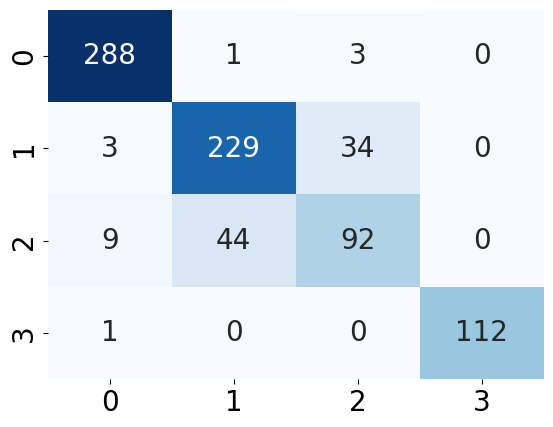

In [66]:
# Gera e imprime um relatório de métricas da classificação (y_test = reais, y_hat = previstos pelo modelo)
# Mostra o desempenho do modelo através da matriz de confusão, ou seja, comparando as classes previstas com as reais
# Cria um mapa de calor para a matriz de confusão

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, recall_score
import seaborn as sns

print(classification_report(y_test, y_hat), '\n')
cm = confusion_matrix(y_test, y_hat)
sns.heatmap(cm, annot=True, cmap="Blues", fmt='.0f', cbar=False)

In [67]:
!pip install tf_keras_vis

DEPRECATION: Loading egg at /usr/local/lib/python3.11/site-packages/AHRS-0.3.1-py3.11.egg is deprecated. pip 23.3 will enforce this behaviour change. A possible replacement is to use pip for package installation..
DEPRECATION: Loading egg at /usr/local/lib/python3.11/site-packages/imufusion-1.2.1-py3.11-macosx-12-x86_64.egg is deprecated. pip 23.3 will enforce this behaviour change. A possible replacement is to use pip for package installation..

[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python3.11 -m pip install --upgrade pip


In [68]:
import tf_keras_vis 
from matplotlib import cm
tf_keras_vis.__version__

'0.8.5'

In [69]:
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.scores import CategoricalScore
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.gradcam_plus_plus import GradcamPlusPlus
from tensorflow.python.ops.numpy_ops import np_config
np_config.enable_numpy_behavior()

In [70]:
# Cria um iterador para iterar sobre os elementos do gerador test_gen
# Obtém os lotes de dados do iterador que retorna as imagens e os labels 
# Encontra os índices dos valores máximos e os converte para uma lista
# Imprime os valores dos índices das classes previstas da lista criada para o lote atual

iterator = iter(test_gen)
# iterator.next()
# iterator.next()

imgs,labs = iterator.next()
real_labs = list(np.argmax(labs, axis=1))
print(real_labs)

[3, 0, 0, 3, 0, 3, 3, 0, 3, 2, 1, 1, 0, 0, 0, 1]


In [71]:
# Redefine o dicionário referente às classes das imagens

class_dict = {
0 : 'Normal',
1 : 'Pneumonia-Bacterial',
2 : 'Pneumonia-Viral',
3 : 'COVID-19',
}

In [72]:
# Notebook que contém a função abaixo: https://www.kaggle.com/code/virajkadam/skin-cancer-classification

# Define uma função que cria um objeto GradCAM++ usando o modelo fornecido e o modelo modificador. 
# O parâmetro clone=True indica que o modelo será clonado para evitar modificar o modelo original durante o processo
# Calcula o mapa de ativação GradCAM++ (cam) para a imagem e a pontuação associada à classe específica 
# Usa a pontuação GradCAM++ para gerar um mapa de calor (heatmap) visualizando as regiões ativadas na imagem usando o mapa de cores "jet". O resultado é normalizado para valores inteiros no intervalo de 0 a 255.

from matplotlib import cm

def get_gradcam_plus(img,
                    score,
                    model=model,
                    model_modifier=ReplaceToLinear()):
    
    gradcam = GradcamPlusPlus(model,
                          model_modifier=model_modifier,
                          clone=True)
    
    cam = gradcam(score,
                  img)
    
    heatmap = np.uint8(cm.jet(cam[0])[..., :3] * 255)
    
    return heatmap

1/1 [==============================] - 1s 504ms/step
[[5.5051260e-08 8.9396184e-07 2.8095023e-08 9.9999905e-01]]


/var/folders/d7/gc5b3w796h7_tb50sl3pqcc80000gn/T/ipykernel_24643/4225178720.py:25: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(BATCH_SIZE,2,idx)


1/1 [==============================] - 0s 260ms/step
[[8.5668051e-01 5.7299551e-02 8.6001232e-02 1.8709665e-05]]
1/1 [==============================] - 0s 260ms/step
[[9.9999523e-01 9.4353901e-08 4.6319228e-06 6.0201791e-12]]
1/1 [==============================] - 0s 330ms/step
[[1.4442210e-04 6.2555887e-06 2.5173470e-06 9.9984682e-01]]
1/1 [==============================] - 0s 313ms/step
[[9.9995971e-01 8.5741658e-06 3.1683463e-05 2.7936670e-11]]
1/1 [==============================] - 0s 256ms/step
[[3.5590067e-05 1.0351671e-03 2.7066059e-04 9.9865854e-01]]
1/1 [==============================] - 0s 216ms/step
[[2.4479338e-08 1.7615417e-10 4.8952530e-12 1.0000000e+00]]
1/1 [==============================] - 0s 226ms/step
[[9.9998653e-01 9.2684309e-07 1.2541807e-05 1.3730418e-10]]
1/1 [==============================] - 0s 234ms/step
[[5.4148345e-06 1.5234953e-04 1.4044711e-04 9.9970180e-01]]
1/1 [==============================] - 0s 250ms/step
[[2.4278420e-04 6.2699485e-01 3.7229654e-01

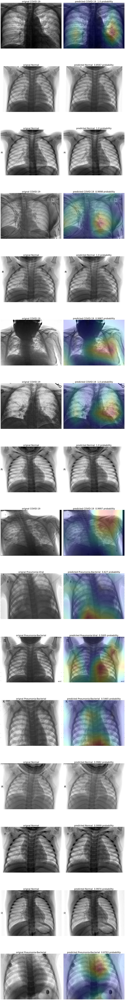

In [73]:
# Plota os resultados das predições do modelo para o batch size, utilizando grad cam para colorir as regiões da imagem que influenciaram na classificação
# Os subplots são criados lado a lado de forma que apareça a imagem original e a classificada pelo modelo com sua probabilidade

import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
import numpy as np
from matplotlib import cm

IM_SIZE_W = 300
IM_SIZE_H = 400

plt.rcParams['font.size'] = '20'
plt.subplots(BATCH_SIZE,1,figsize=(20,160))
idx=1
for i,img in enumerate(imgs[:BATCH_SIZE]):
    img_4d = tf.cast(tf.reshape(img, [1, IM_SIZE_W, IM_SIZE_H, 1]), tf.float32)
    predict = model.predict(img_4d)
    print(predict)
    prd = np.argmax(predict)
#     print(f'class: {class_dict[prd]}')
    score1 = CategoricalScore(prd)
    original_lab = real_labs[i]
    
    plt.subplot(BATCH_SIZE,2,idx)
    plt.title(f'orignal {class_dict[original_lab]}')
    plt.axis('off')
    plt.imshow(img, cmap=plt.cm.binary)
    idx+=1
    
    plt.subplot(BATCH_SIZE,2,idx)
    gdcam_pls = get_gradcam_plus(img, score1)
    plt.imshow(img, cmap=plt.cm.binary)
    if prd:
        plt.imshow(gdcam_pls, alpha=0.2, cmap='jet')
    
    proba = round(float(predict[0][prd]), 4)
    plt.title(f'predicted {class_dict[prd]}  {proba} probability')
    plt.axis('off')
    idx+=1
    if idx>BATCH_SIZE*2:
        break

plt.tight_layout()
plt.show()

In [74]:
import gradio as gr
import torch
import requests
from torchvision import transforms
from tensorflow.keras.models import load_model
from fpdf import FPDF
import os
import tempfile
import json
import csv
from json import dumps

In [75]:
# Confirma os tamanhos da imagem

IM_SIZE_W = 300
IM_SIZE_H = 400


In [76]:
# Cria uma função para gerar um relatório em pdf a cada vez que uma imagem for classificada
# Define a estrutura do relatório utilizando biblioteca fpdf

def create_pdf_report(image, results):
    print(type(results))
    diagnostico = results['label']
    # processed_results = json.dumps(results)
    # print(type(processed_results))
    dir = notebook_path + "/reports"
    report=os.path.join(dir,"report.pdf")
    pdf = FPDF()
    pdf.add_page()
    pdf.set_font('Arial','B',16)
    pdf.cell(0, 10, txt="Report", ln=1,align="C")
    pdf.ln(10) 
    pdf.set_font('Arial', size=12, style='')
    if diagnostico != 'Normal':
        pdf.multi_cell(0, 10, txt="The X-Ray indicates that the patient needs a deeper examination since the model suggests that he/she is infected with: ", align="C")       
    else:
        pdf.multi_cell(0, 10, txt="The X-Ray indicates that the patient is healthy. No need for further examination. ", align="C")
    pdf.ln(10) 
    pdf.multi_cell(0, 10, txt=diagnostico,align="C")
    pdf.ln(10) 
    pdf.image(image, x=10, y=None, w=190)
    pdf.ln(10) 
    pdf.output(report)
    print("pdf gerado")
    return results, report



In [77]:
# Define função de classificação da imagem adicionada no input
# Pré-processa a imagem para que fique de acordo com os dados de treinamento do modelo

def predict_input_image(img):
    print(img)
    if img == None:
        raise gr.Error("Cannot classify without an image! Please upload a chest X-Ray to see the results.")
    else:
        img = cv2.imread(img, cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img, (IM_SIZE_W, IM_SIZE_H))
        img = tf.convert_to_tensor(img, dtype=tf.float32)
        img /= 255.0
        img = tf.expand_dims(img, axis=-1)
        img_4d = tf.reshape(img, [1, IM_SIZE_W, IM_SIZE_H, 1])
        prediction=model.predict(img_4d)[0]
        print(prediction)
        print(class_dict)
        return {class_dict[i]: float(prediction[i]) for i in range(len(class_dict))}, gr.Button(interactive=True)


In [78]:
# Define função para desabilitar o botão de geração de relatório para quando não houver imagem classificada, ou quando clicar no botão de limpar input/output

def disable_report_btn():
    return gr.Button(interactive=False)

In [79]:
# Define o título e a descrição do software que serão exibidos no topo da página do sistema

title="<p style='text-align: center;font-size: 30px'><b>P-scan - Pulmonary diseases detector</b></p>"
description="<p style='text-align: center;font-size: 20px'>This Convolution Neural Network was trained on to recognize pulmonary diseases such as COVID-19, viral pneumonia and bacterial pneumonia.</p>"


In [ ]:
# Define interface gráfica Gradio para classificação do modelo

with gr.Blocks(theme=gr.themes.Soft()) as app:
    gr.Markdown(title)
    gr.Markdown(description)
    
    with gr.Row():
        image_input = gr.Image(type="filepath", interactive=True, height=400, width=400)
        image_output = gr.Label(num_top_classes=4)
  
    with gr.Row():
        gr.Examples([notebook_path + "/examples/pneumonia.jpeg",notebook_path + "/examples/pneumonia2.jpeg", notebook_path + "/examples/pneumonia3.jpeg", notebook_path + "/examples/healthy.jpeg", notebook_path + "/examples/healthy2.jpeg" ], image_input)

    with gr.Row():
        classify_btn = gr.Button("Classify image", variant="primary")
        report_btn = gr.Button("Create report", variant="primary", interactive=False)
        
        classify_btn.click(predict_input_image, image_input, [image_output,report_btn])
        report_btn.click(create_pdf_report, [image_input, image_output], None)

    with gr.Row():
        clear_btn = gr.ClearButton(value="Clear", variant="primary", components=[image_input, image_output])
        clear_btn.click(disable_report_btn, None, report_btn)

app.launch(debug='True', show_error=True, auth = ('admin', 'password'), auth_message="Please input your credentials to continue.", share=True, favicon_path=notebook_path + "/assets/lungs.ico")

Running on local URL:  http://127.0.0.1:7860
Running on public URL: https://e022e80cd8519960b4.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)


In [ ]:
# Mostra todos os pacotes instalados no ambiente Python e suas versões. Utilizei para selecionar os pacotes utilizados nesse sistema para criar um requirements.txt

# import pkg_resources
 
# installed_packages = pkg_resources.working_set
# for package in installed_packages:
#     print(f"{package.key}=={package.version}")